In [13]:
#отключим предупреждения Anaconda
import warnings 
warnings.simplefilter('ignore')

In [5]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

#Будем выводить изображения в формате svg
%config InlineBackend.figure_format = 'svg'

In [7]:
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import pandas as pd

#**Загружаем дата сет**

In [11]:
data = pd.read_csv('/content/Video_Games_Sales_as_at_22_Dec_2016.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [17]:
data.shape

(16719, 16)

**Некоторые признаки pandas считает за object приведем их явным образом к float или int**

In [15]:
#data['User_Score'] = data.User_Score.astype('float64')
#data['Year_of_Release'] = data.Year_of_Release.astype('int64')
#data['User_Count'] = data.User_Count.astype('int64')
#data['Critic_Count'] = data.Critic_Count.astype('int64')

В некоторых строках есть пропуски, удалим такие строки при помощи метода dropna()

In [18]:
data = data.dropna()

In [19]:
data.shape

(6825, 16)

In [20]:
data.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E


Мы будем использовать не все столбцы.

In [22]:
#задаем полезные столбцы, те которые будем использовать

In [21]:
useful_columns = ['Name', 'Platform', 'Year_of_Release', 'Genre', 
               'Global_Sales', 'Critic_Score', 'Critic_Count',
               'User_Score', 'User_Count', 'Rating']

data[useful_columns].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006.0,Sports,82.53,76.0,51.0,8,322.0,E
2,Mario Kart Wii,Wii,2008.0,Racing,35.52,82.0,73.0,8.3,709.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,32.77,80.0,73.0,8,192.0,E
6,New Super Mario Bros.,DS,2006.0,Platform,29.80,89.0,65.0,8.5,431.0,E
7,Wii Play,Wii,2006.0,Misc,28.92,58.0,41.0,6.6,129.0,E


**We will start using plot**

построим график продаж видео игр в различных странах в зависимости от года.

In [24]:
#Получаем датафрейм с продажами и годом релиза
sales_df = data[[x for x in data.columns if 'Sales' in x] + ['Year_of_Release']]

sales_df.head()

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Year_of_Release
0,41.36,28.96,3.77,8.45,82.53,2006.0
2,15.68,12.76,3.79,3.29,35.52,2008.0
3,15.61,10.93,3.28,2.95,32.77,2009.0
6,11.28,9.14,6.50,2.88,29.80,2006.0
7,13.96,9.18,2.93,2.84,28.92,2006.0


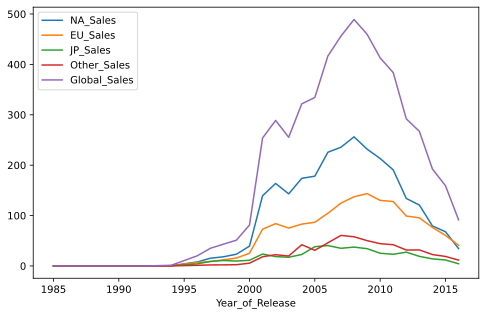

In [25]:
sales_df.groupby('Year_of_Release').sum().plot()

можно менять стиль графиков как угодно. Например, при помощи параметра kind можно менять тип графика, а при помощи параметра rot можно менять угол наклона подписей на графике:

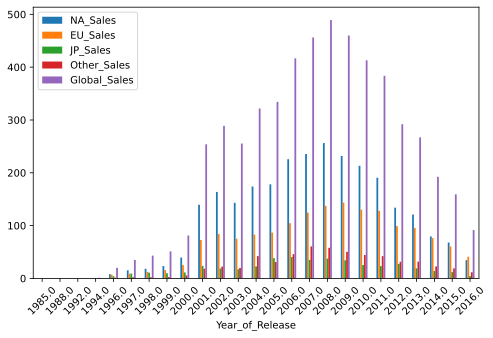

In [26]:
sales_df.groupby('Year_of_Release').sum().plot(kind='bar', rot=45)

#Seaborn

**это надстройка над matplotlib**

In [27]:
#выбираем столбцы
columns = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']

sns_plot = sns.pairplot(data[columns])
sns_plot.savefig('pairplot.png')

**Можно построить гистограмму**

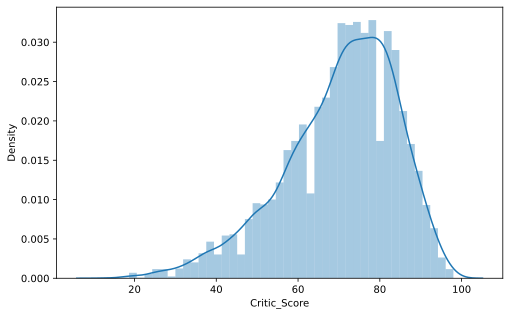

In [28]:
sns.distplot(data.Critic_Score)

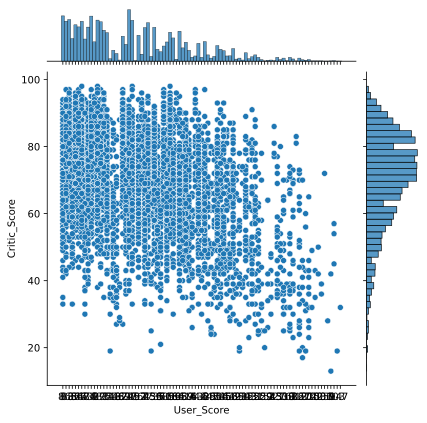

In [31]:
sns.jointplot(data.User_Score, data.Critic_Score)

Давайте сравним оценки игр от критиков для топ-5 крупнейших игровых платформ.

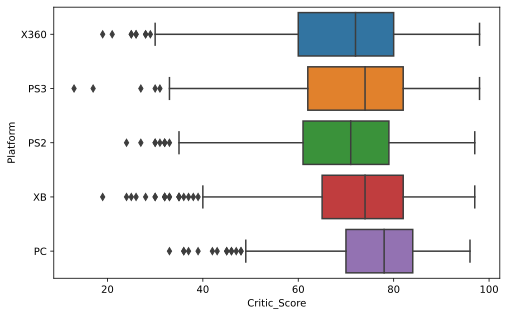

In [41]:
#Сначала считаем кол-во каждой платформы, сортируем по возрастанию
#Выводим первые пять и снимаем индексы: head().index - названия платформ в нашем случае
#Далее переводим индексы в массив: head().index.values как бы получаем значения индексов

top_platforms = data.Platform.value_counts().sort_values(ascending = False).head(5).index.values 

sns.boxplot(y='Platform', x='Critic_Score', data = data[data.Platform.isin(top_platforms)], orient='h')

**Heat map**

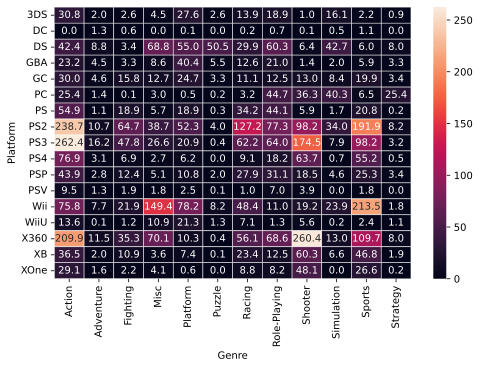

In [44]:
platform_genre_sales = data.pivot_table(
    index = 'Platform',
    columns = 'Genre',
    values = 'Global_Sales',
    aggfunc = sum
).fillna(0).applymap(float)

sns.heatmap(platform_genre_sales, annot=True, fmt='.1f', linewidth=.5)

#Plotly

**Interactive plots**

In [46]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly
import plotly.graph_objs as go 

init_notebook_mode(connected=True) #инициализация plotly